### Advanced Lane Finding Project
#### The goals / steps of this project are the following:
    Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
    Apply a distortion correction to raw images.
    Use color transforms, gradients, etc., to create a thresholded binary image.
    Apply a perspective transform to rectify binary image ("birds-eye view").
    Detect lane pixels and fit to find the lane boundary.
    Determine the curvature of the lane and vehicle position with respect to center.
    Warp the detected lane boundaries back onto the original image.
    Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob


%matplotlib inline

#### Camera calibration
The first step is calibrating the camera and use the calibrated values to correct he images.
Usually images are distorted and we need to undistort the image
The following functions help in camera calibration and image distortion correction

Here we use chessboard images to calibrate the camera and get the required matrices to correct any new image


(720, 1280, 3)


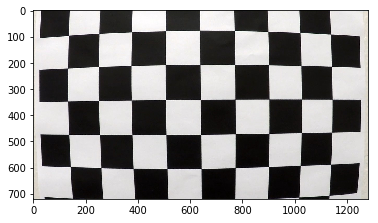

In [2]:
# Display image to calculate nx and ny values
img = mpimg.imread('camera_cal/calibration1.jpg')
image_shape = img.shape
print(image_shape)
plt.imshow(img)

In [3]:
# Looking at image above we get the values
nx = 9 #number of inside corners in x
ny = 6 #number of inside corners in y


In [4]:
def calibrate_camera(nx=9,ny=6):
    '''
    Loads the chessboard files and using it finds the camera transformation matrix and distortion coefficients.
    Inputs : Number of corners in x & y axis
    Output : camera transformation matrix and distortion coefficients
    '''
    #Arrays to store object points and image points from all the images
    objpoints = [] # 3D points in real world space
    imgpoints = [] # 2D points in image space
    #Prepare object points , like (0,0,0),(1,0,0),(2,0,0) .... (6,4,0)
    objp = np.zeros((nx*ny,3),np.float32)
    #mgrid returns the corodinate values for a given grid size and will shape
    #those cordinates back into 2 columns, one for x & one for y
    objp[:,:2]  = np.mgrid[0:nx,0:ny].T.reshape(-1,2) #x&y coordinates

    # Get the names of set of chessboard images
    images = glob.glob("camera_cal/calibration*.jpg")

    for image_name in images:
        #read each image
        img = mpimg.imread(image_name)
        #Convert image to grayscale
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        #Find the chessboard corners
        ret,corners = cv2.findChessboardCorners(gray,(nx,ny),None) 

        #If corners are found , add object points , image points
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)

    # Get all the parameters        
    ret,mtx,dist,rvecs,tvecs = cv2.calibrateCamera(objpoints,imgpoints,gray.shape[::-1],None,None)

    return mtx,dist

        

### Below is function to undistort an image

In [5]:
def image_undist(img,mtx,dist):
    '''
    This function undistorts an image
    Inputs : distorted image, transformation matrix & distortion coefficients
    Output : Undsitorted image
    '''
    undistorted_image = cv2.undistort(img, mtx, dist, None, mtx)
    return undistorted_image

##### Testing of camera calibration and undistortion function

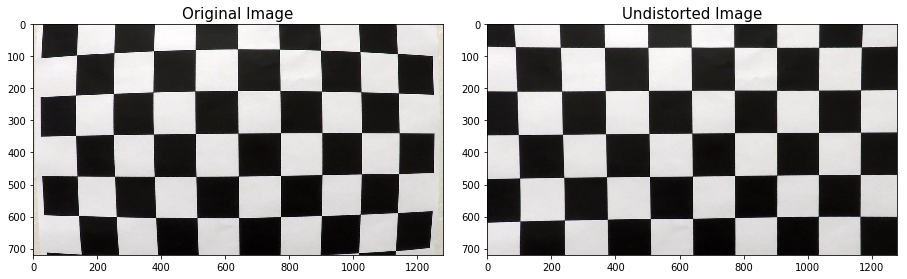

In [6]:

def test_calibration_undistort():
    #Store the camera transformation matrix "mtx" and distortion coefficients "dist"
    mtx,dist = calibrate_camera()

    # Load any chessboard image
    img = mpimg.imread('camera_cal/calibration1.jpg')

    #Get the undistorted image
    undistorted_image = image_undist(img,mtx,dist)

    #Display the images
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=15)
    ax2.imshow(undistorted_image)
    ax2.set_title('Undistorted Image', fontsize=15)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#Run the test
test_calibration_undistort()

#### Following functions were created to apply thresholds on various channels and come up with a final binary image, on which perceptive transformation was applied and curvature radius was calculated

### Create a function to calculate sobel_x and sobel_y and based on threshold output a binary image

In [7]:


# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255, sobel_kernel = 3):
    '''
    This function applies Sobel x or y, 
    then takes an absolute value and applies a threshold.
    Input : Image, orientation of sobel, threshold values & size of sobel kernel
    Output : Binary output after applying the sobel thresholds
    '''
    #Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    #Take the derivative in x or y given orient = 'x' or 'y'
    if orient=='x':
        sobel_dir = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
    if orient=='y':
        sobel_dir = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)
    #Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel_dir)
    #Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    #Create a mask of 1's where the scaled gradient magnitude 
    # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel>=thresh_min) & (scaled_sobel<=thresh_max)] = 1
    #Return this mask as your binary_output image
    return binary_output

##### Test the abs_sobel_thresh function

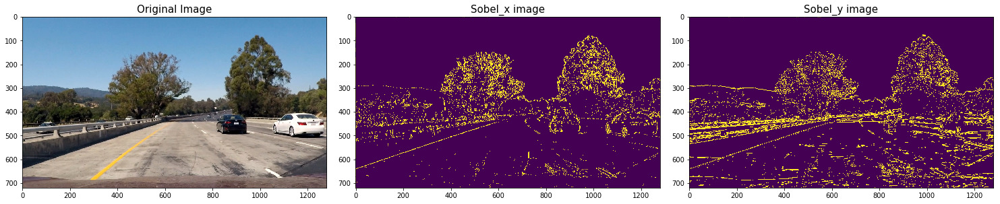

In [8]:
def test_abs_sobel_thresh():
    # Read in an image
    image = mpimg.imread('./test_images/test1.jpg')

    # Run the function
    gradx = abs_sobel_thresh(image, orient='x', thresh_min=20, thresh_max=100 , sobel_kernel = 3)
    grady = abs_sobel_thresh(image, orient='y', thresh_min=20, thresh_max=100 , sobel_kernel = 3)

    #Display the images
    f, (ax1,ax2,ax3) = plt.subplots(1, 3, figsize=(20, 10))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=15)
    ax2.imshow(gradx)
    ax2.set_title('Sobel_x image', fontsize=15)
    ax3.imshow(grady)
    ax3.set_title('Sobel_y image', fontsize=15)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#Run the test
test_abs_sobel_thresh()

### Below function computes the magnitude of the gradient and then applies the threshold

In [9]:

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    '''
    Applies applies Sobel x and y,computes the magnitude of the gradient
    and then applies a threshold
    Inputs: image, size of the sobel kernel and magnitude threshold values
    Output: Binary output after applying magnitude thresholds
    '''
    #Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    #Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)
    #Calculate the magnitude 
    gradmag = np.sqrt(sobel_x**2 + sobel_y ** 2)
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255
    gradmag =(gradmag/scale_factor).astype(np.uint8)
    #Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    #Return this mask as your binary_output image
    return binary_output
    


##### Test the mag_thresh function

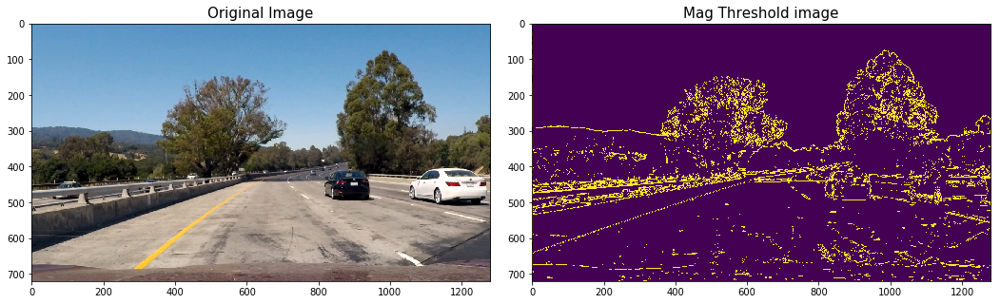

In [10]:
def test_mag_thresh():
    # Read in an image
    image = mpimg.imread('./test_images/test1.jpg')

    # Run the function
    mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))

    #Display the images
    f, (ax1,ax2) = plt.subplots(1, 2, figsize=(14, 8))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=15)
    ax2.imshow(mag_binary)
    ax2.set_title('Mag Threshold image', fontsize=15)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#Run the test
test_mag_thresh()

### Below function applies sobel x & y and then computes the direction of the gradient

In [11]:

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    '''
    This function applies Sobel x and y,then computes the direction of the gradient
    and then applies a threshold.
    Inputs: image, size of the sobel kernel and gradient threshold values
    Output: Binary output after applying gradient thresholds
    '''
    #Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    #Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    #Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    #Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
    absgraddir  = np.arctan2(abs_sobely, abs_sobelx)
    #Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    #Return this mask as your binary_output image
    
    return binary_output

##### Test the dir_threshold function

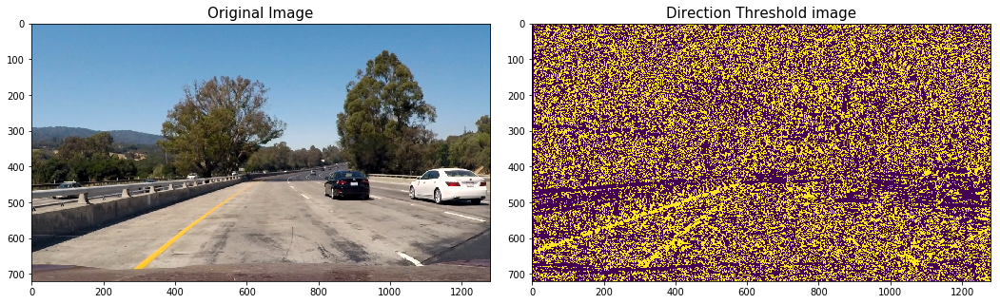

In [12]:
def test_dir_threshold():
    # Read in an image
    image = mpimg.imread('./test_images/test1.jpg')

    # Run the function
    dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))

    #Display the images
    f, (ax1,ax2) = plt.subplots(1, 2, figsize=(14, 8))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=15)
    ax2.imshow(dir_binary)
    ax2.set_title('Direction Threshold image', fontsize=15)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#Run the test
test_dir_threshold()

### Define function that applys S channel threshold to an image in HLS image space

In [13]:

# Define a function that thresholds the S-channel of HLS
def hls_s_select(img, thresh=(0, 255)):
    '''
    This function converts the image to HLS image space
    Then applies threshold to S channel
    Inputs : Image and S channel thresholds
    Output : Binary output after applying the S channel thresholds
    '''
    # Convert the image from RGB format to HLS
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    #Get the S Channel
    s_channel = hls[:,:,2]
    #Apply S Channel Thresholds
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output




##### Test the hls_s_select function

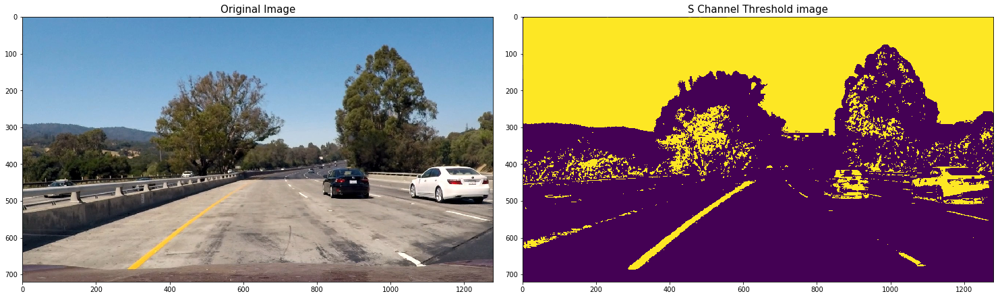

In [14]:
def test_hls_s_select():
    # Read in an image
    image = mpimg.imread('./test_images/test1.jpg')

    # Run the function
    hls_s_binary = hls_s_select(image, thresh=(90, 255))

    #Display the images
    f, (ax1,ax2) = plt.subplots(1, 2, figsize=(20, 10))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=15)
    ax2.imshow(hls_s_binary)
    ax2.set_title('S Channel Threshold image', fontsize=15)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#Run the test
test_hls_s_select()

### Define a function that thresholds the L-channel of HLS

In [15]:

# Define a function that thresholds the L-channel of HLS
def hls_l_select(img, thresh=(0, 255)):
    '''
    This function converts the image to HLS image space
    Then applies threshold to L channel
    Inputs : Image and L channel thresholds
    Output : Binary output after applying the L channel thresholds
    '''
    # Convert the image from RGB format to HLS
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    #Get the S Channel
    l_channel = hls[:,:,1]
    #Apply S Channel Thresholds
    binary_output = np.zeros_like(l_channel)
    binary_output[(l_channel > thresh[0]) & (l_channel <= thresh[1])] = 1
    return binary_output




##### Test the hls_s_select function

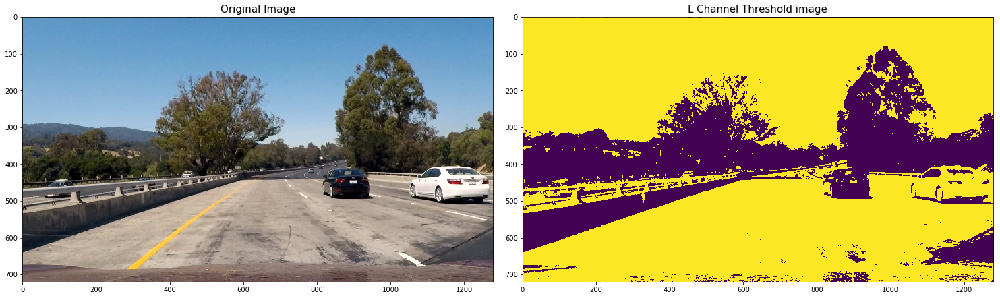

In [16]:
def test_hls_l_select():
    # Read in an image
    image = mpimg.imread('./test_images/test1.jpg')

    # Run the function
    hls_l_binary = hls_l_select(image, thresh=(90, 255))

    #Display the images
    f, (ax1,ax2) = plt.subplots(1, 2, figsize=(20, 10))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=15)
    ax2.imshow(hls_l_binary)
    ax2.set_title('L Channel Threshold image', fontsize=15)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#Run the test
test_hls_l_select()

### Define a function that thresholds the R & G Channel of RGB Image

In [17]:

# Define a function that thresholds the R & G Channel of RGB Image
def rgb_rg_select(img, threshold = 175):
    '''
    Then applies threshold to R & G channels
    Inputs : Image(RGB Format) and R & G channel threshold
    Output : Binary output after applying the R & G channel threshold
    '''
    #Get the R & G Channel
    r_channel = img[:,:,0]
    g_channel = img[:,:,1]
    #Apply R & G  Channel Thresholds
    binary_output = np.zeros_like(r_channel)
    binary_output[(r_channel > threshold ) & (g_channel > threshold )] = 1
    return binary_output




##### Test the rgb_rg_select function

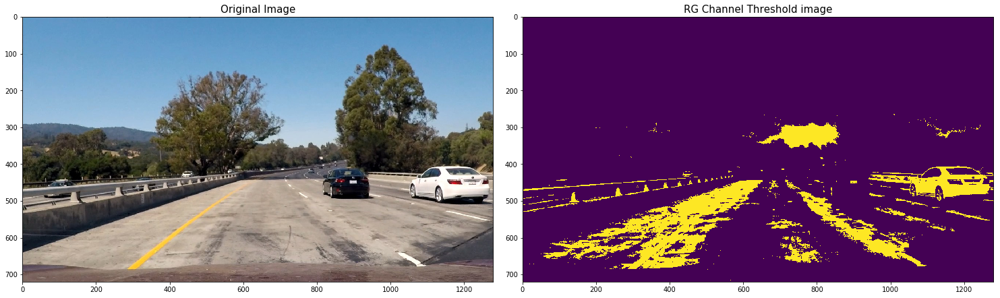

In [18]:
def test_rgb_rg_select():
    # Read in an image
    image = mpimg.imread('./test_images/test1.jpg')

    # Run the function
    rgb_rg_binary = rgb_rg_select(image, threshold=175)

    #Display the images
    f, (ax1,ax2) = plt.subplots(1, 2, figsize=(20, 10))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=15)
    ax2.imshow(rgb_rg_binary)
    ax2.set_title('RG Channel Threshold image', fontsize=15)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#Run the test
test_rgb_rg_select()

### Define a function that thresholds the B-channel & L-channel of LAB and LUV space

In [19]:

# Define a function that thresholds the B-channel & L-channel of LAB and LUV space
# This function is created so that the model peforms better in areas which has shade
def lb_select(img,thresh_b=(0, 255),thresh_l=(0, 255)):
    '''
    This function converts the image to LAB & LUV image spaces
    Then applies threshold to L channel & B Channel
    Inputs : Image and L & B channels thresholds
    Output : Binary output after applying the L & B channels thresholds
    '''
    # Convert the image from RGB format to LAB
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
    #Get the S Channel
    b_channel = lab[:,:,2]
    #Apply S Channel Thresholds
    binary_output_1 = np.zeros_like(b_channel)
    binary_output_1[(b_channel > thresh_b[0]) & (b_channel <= thresh_b[1])] = 1
    
    # Convert the image from RGB format to LAB
    luv = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)
    #Get the S Channel
    l_channel = luv[:,:,0]
    #Apply S Channel Thresholds
    binary_output_2 = np.zeros_like(l_channel)
    binary_output_2[(l_channel > thresh_l[0]) & (l_channel <= thresh_l[1])] = 1
    
    binary_output = np.zeros_like(binary_output_2)
    binary_output[(binary_output_1 == 1) | (binary_output_2 == 1)] = 1
    
    return binary_output



##### Test the lb_select function

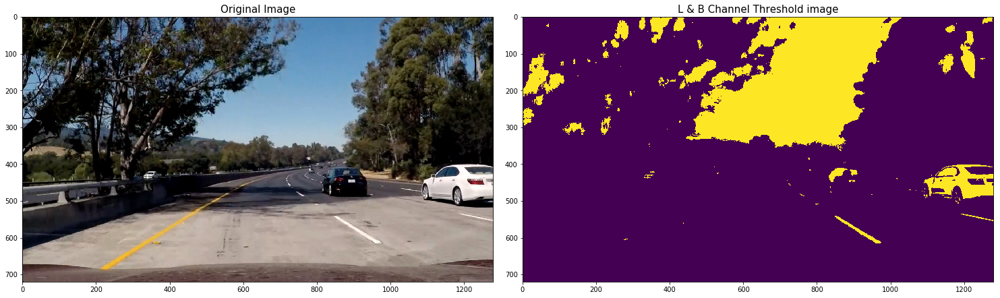

In [20]:
def test_lb_select():
    # Read in an image
    image = mpimg.imread('./test_images/test5.jpg')

    # Run the function
    #lb_select_binary = lb_select(image, thresh_b=(155, 200) ,thresh_l=(225, 255))
    lb_select_binary = lb_select(image, thresh_b=(140, 180) ,thresh_l=(200, 255))

    #Display the images
    f, (ax1,ax2) = plt.subplots(1, 2, figsize=(20, 10))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=15)
    ax2.imshow(lb_select_binary)
    ax2.set_title('L & B Channel Threshold image', fontsize=15)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#Run the test
test_lb_select()

### Perceptive Transform

#### get_perceptive_transform_params function returns the M and Minv values required for percpetive transformation

In [21]:
def get_perceptive_transform_params(image):
    '''
    This function selects source and destination points 
    and calculates the perceptive transformation matrices M * Minv
    Input : Image
    Output : M & Minv
    '''
    #Convert the image to gray scale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    img_size = (gray.shape[1], gray.shape[0])

    # Finalized on src,dst and offset after some trail and error.
    offset = 70
    top_left_src = (img.shape[1]//2 - offset , 470 )
    top_right_src = (img.shape[1]//2 + offset , 470 )
    bottom_left_src = (img.shape[1]//2 - 5*offset , img.shape[0]-30)
    bottom_right_src =  (img.shape[1]//2 + 5*offset , img.shape[0]-30)
    top_left_dst = (img.shape[1]//5, 0 )
    top_right_dst = ( img.shape[1] - img.shape[1]//5  , 0 )
    bottom_left_dst = (img.shape[1]//5 , img.shape[0])
    bottom_right_dst =  (img.shape[1] - img.shape[1]//5, img.shape[0])
    src = np.float32([bottom_left_src,bottom_right_src,top_right_src,top_left_src])
    dst = np.float32([bottom_left_dst,bottom_right_dst,top_right_dst,top_left_dst])
    
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # Warp the image using OpenCV warpPerspective()
    #undist = cv2.undistort(image,mtx,dist,None,mtx)
    #warped = cv2.warpPerspective(undist, M, img_size)
    
    return M,Minv

# Function to wrap the image
def wrap_image(image,M):
    '''
    This function takes an image and applied the perceptive pransform
    Input : Image, Perceptive Transform Matrix
    Output : warped image
    '''
    #Convert the image to gray scale
    #gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    img_size = (image.shape[1], image.shape[0])
    warped = cv2.warpPerspective(image, M, img_size)
    return warped


### Test the perceptive transform functions

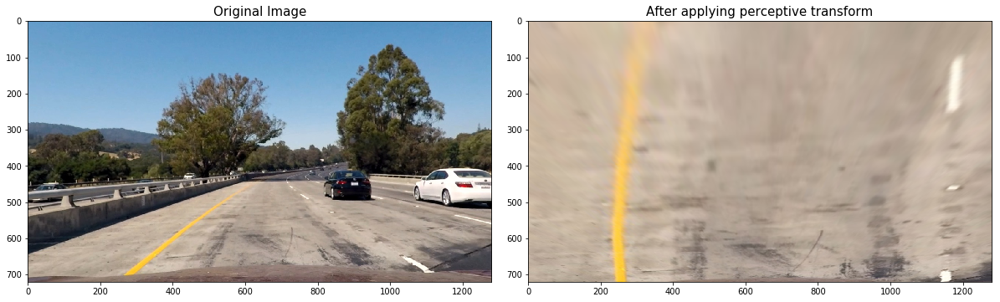

In [22]:
def test_preceptive_transform():
    # Test the hls_select function
    
    #Store the camera transformation matrix "mtx" and distortion coefficients "dist"
    mtx,dist = calibrate_camera()
    
    # Read in an image
    image = mpimg.imread('./test_images/test1.jpg')
    undistorted_image  =  image_undist(image,mtx,dist)

    #Apply the functions
    M,Minv = get_perceptive_transform_params(image)
    wraped_image = wrap_image(undistorted_image,M)

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    f.tight_layout()
    ax1.imshow(undistorted_image)
    ax1.set_title('Original Image', fontsize=15)
    ax2.imshow(wraped_image)
    ax2.set_title('After applying perceptive transform', fontsize=15)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#Test the function
test_preceptive_transform()

## Image processing pipeline function
The following steps were done to come up with the image processing pipeline.
Stage1:
---------
1. The distorted image was corrected using the coefficient got from the camera calibration function
2. Sobel gradients were calculated in both x & y direction and threshold was applied
3. Magnitude of the sobel_x & sobel_y were calculated and applied thresholds
4. Direction of the gradient was calculated and threshold applied.
5. Now using the above calculation a binary image was created.
Note: Sobel_y didn't add much value and even magnitude of the sobel gradients. So both of these were not used in the pipeline.

Stage2:
-----------
1. Image was converted to HLS image format and S Channel was separted out and threshold was applied
2. The binary image created in Stage1 and S_Channel binary image were combined to form another binary image
3. Combine the binary from above image with R,G & L Channel thresholds to get a intermediate binary image

Stage3:
-----------
1. To improve the performance of pipeline in dark areas made used of L Channel of LUV image space and B Channel of Lab image space and thresholds were applied

2.The binary image resulting from the above step was combined with the binary image from Stage2 to get final binary image




In [23]:
#Store the camera transformation matrix "mtx" and distortion coefficients "dist"
# This is one time step and therefore do outside the pipeline
mtx,dist = calibrate_camera()

In [24]:
def image_process_pipeline(img,mtx,dist):
    '''
    The function takes various channels of the image in different image space
    and applied thresholds to these channels.
    Input: Image
    Output : Final Binary Image
    '''

    #Undistort the #Get the undistorted image
    undistorted_image = image_undist(img,mtx,dist)

    # Calculate sobel gradients in x & y directionsand apply thresholds
    gradx = abs_sobel_thresh(undistorted_image , orient='x', thresh_min=20, thresh_max=100 , sobel_kernel = 3)
    grady = abs_sobel_thresh(undistorted_image , orient='y', thresh_min=20, thresh_max=100 , sobel_kernel = 3)

    #Calculate magnitude of the gradient and apply threshold
    mag_binary = mag_thresh( undistorted_image , sobel_kernel=3, mag_thresh=(30, 100))

    #Calculate direction of the gradient and apply threshold
    dir_binary = dir_threshold( undistorted_image , sobel_kernel=15, thresh=(0.7, 1.3))

    #Combine all the above 3 thresholds
    combined_binary_stage1 = np.zeros_like(dir_binary)
    #combined_binary_stage1[((gradx == 1) & (grady == 1)) & ((mag_binary == 1) & (dir_binary == 1))] = 1
    combined_binary_stage1[(gradx == 1) &(dir_binary == 1)] = 1

  
    #Convert image to HLS image space and apply thershold on S channel
    hls_s_binary = hls_s_select( undistorted_image  , thresh=(90, 255))
    hls_l_binary = hls_l_select(img, thresh=(150, 255))
    rgb_rg_binary = rgb_rg_select(img, threshold = 150 )
    
    # Combine the thresholds
    combined_binary_stage2 = np.zeros_like(combined_binary_stage1)
    combined_binary_stage2[(hls_s_binary == 1) | (combined_binary_stage1 == 1)] = 1

    # Combine with R,G & L thresholds
    combined_binary_1 = np.zeros_like(combined_binary_stage2)
    combined_binary_1[(rgb_rg_binary & hls_l_binary) & (combined_binary_stage2==1)] = 1
    
    #Now make use of L & B Channel thresholds
    lb_select_binary = lb_select(undistorted_image, thresh_b=(140, 180) ,thresh_l=(200, 255))
    combined_binary = np.zeros_like(combined_binary_stage2)
    combined_binary[(lb_select_binary==1) | (combined_binary_1==1)] = 1
    
    
    # Get the M and Minv perspective tansformation matrices
    M,Minv = get_perceptive_transform_params(img)

    # Apply the percpetive transform
    wraped_image = wrap_image( combined_binary_stage2 ,M)
    
    return wraped_image,Minv




##### Test the image_process_pipeline function

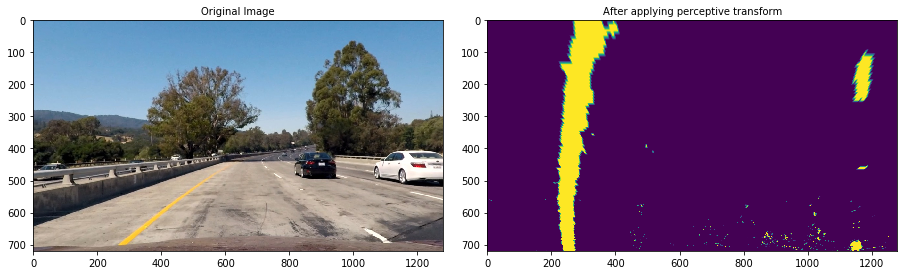

In [25]:
def test_image_process_pipeline():
    #Store the camera transformation matrix "mtx" and distortion coefficients "dist"
    # This is one time step and therefore do outside the pipeline
    mtx,dist = calibrate_camera()
    # Read in an image
    image = mpimg.imread('./test_images/test1.jpg')
    #print(image)
    undistorted_image  =  image_undist(image,mtx,dist)
    wraped_image, Minv = image_process_pipeline(image,mtx,dist)

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    f.tight_layout()
    ax1.imshow(undistorted_image)
    ax1.set_title('Original Image', fontsize=10)
    ax2.imshow(wraped_image)
    ax2.set_title('After applying perceptive transform', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#Run the test
test_image_process_pipeline()

### Draw a polynomial

Below set of functions find the pixals along the lane and caluclate the curvature radius and offset

#### Below function takes the bottom half of image and sum image pixel verticially

In [26]:
def hist(img):
    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//2:,:]

    # Sum across image pixels vertically - make sure to set an `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    
    return histogram


#### Below function find pixels along the lane

In [27]:
def measure_curvature_real(bin_warp_img,left_fitx,right_fitx):
    '''
    Calculates the curvature of polynomial functions in meters.
    Input: bin_warp_img,left_fitx,right_fitx
    Output: left_curverad, right_curverad , offset_meters
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, bin_warp_img.shape[0]-1, bin_warp_img.shape[0] )
    
    # Fit the polynomials in real world
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # compute the offset from the center
    lane_center = (right_fitx[bin_warp_img.shape[0]-1] + left_fitx[bin_warp_img.shape[0]-1])/2
    offset_pixels = abs(bin_warp_img.shape[1]/2 - lane_center) # Corrected as per review
    offset_meters = xm_per_pix*offset_pixels
   
    return left_curverad, right_curverad , offset_meters


def find_lane_pixels(bin_warp_img):
    '''
    Finds the pixals along both left and right lane
    Input: Binary image
    Output: leftx, lefty, rightx, righty, out_img
    '''
    # Take a histogram of the bottom half of the image
    histogram = np.sum(bin_warp_img[bin_warp_img.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((bin_warp_img, bin_warp_img, bin_warp_img))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(bin_warp_img.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = bin_warp_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = bin_warp_img.shape[0] - (window+1)*window_height
        win_y_high = bin_warp_img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(bin_warp_img,display=False):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(bin_warp_img)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, bin_warp_img.shape[0]-1, bin_warp_img.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    if display:
        ## Visualization ##
        # Colors in the left and right lane regions
        out_img[lefty, leftx] = [255, 0, 0]
        out_img[righty, rightx] = [0, 0, 255]

        # Plots the left and right polynomials on the lane lines
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
    
    left_radius,right_radius,center_offset = measure_curvature_real(bin_warp_img,left_fitx,right_fitx)

    return left_fitx ,right_fitx ,out_img,left_radius,right_radius,center_offset



##### Test the find_lane_pixels & fit_polynomial functions

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


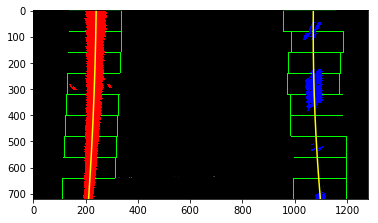

In [28]:
def test_2():
    #Store the camera transformation matrix "mtx" and distortion coefficients "dist"
    # This is one time step and therefore do outside the pipeline
    mtx,dist = calibrate_camera()

    # Read in an image
    image = mpimg.imread('./test_images/straight_lines1.jpg')
    undistorted_image  =  image_undist(image,mtx,dist)
    binary_warped, Minv = image_process_pipeline(image,mtx,dist)

    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    left_fitx ,right_fitx,out_img,left_radius,right_radius,center_offset = fit_polynomial(binary_warped,display=True)
    plt.imshow(out_img)

#Run the test
test_2()

### Project the wraped image on the original image

In [29]:

def sane_lane(left_fitx, right_fitx):
    '''
    This function handles scenario where the difference between 2 subsequent lanes is too high.
    '''
    global sane_left
    global sane_right
    if len(sane_left) > 0 :
        if np.average(np.abs(left_fitx - sane_left)) < 80:
            sane_left = left_fitx
        if np.average(np.abs(right_fitx - sane_right)) < 80:
            sane_right = right_fitx

    else:
        sane_left = left_fitx
        sane_right = right_fitx
    return sane_left, sane_right

In [30]:
def wrap_image_project(orig_image,warped,Minv,left_radius,right_radius,center_offset,left_fitx ,right_fitx):
    '''
    Take the binary image and project it onto the original image
    Input: orig_image,warped,Minv,left_radius,right_radius,center_offset,left_fitx ,right_fitx
    Output: Original image file with the identified lane projected on to it
    '''
    #Handle scenario where difference between 2 subsequent lanes is too high
    left_fitx, right_fitx = sane_lane(left_fitx, right_fitx)
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    #Get the size of the image
    img_size = (warped.shape[1], warped.shape[0])
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, img_size ) 
    # Combine the result with the original image
    result = cv2.addWeighted(orig_image, 1, newwarp, 0.3, 0)
    
    curve_radius = (left_radius+right_radius)/2
    curve_radius_msg = "Radius of curvature: {0:.2f} m".format(curve_radius)
    center_offset_msg = "Center offset: {0:.2f} m".format(center_offset)
    cv2.putText(result,curve_radius_msg , (100, 90), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)
    cv2.putText(result, center_offset_msg, (100, 150), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)
    
    return result


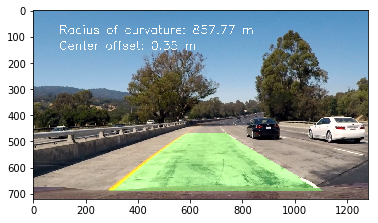

In [31]:
global sane_left
global sane_right
sane_left = []
sane_right = []
def test_4():
    #Store the camera transformation matrix "mtx" and distortion coefficients "dist"
    # This is one time step and therefore do outside the pipeline
    mtx,dist = calibrate_camera()

    # Read in an image
    image = mpimg.imread('./test_images/test1.jpg')
    undistorted_image  =  image_undist(image,mtx,dist)
    binary_warped, Minv = image_process_pipeline(image,mtx,dist)

    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    left_fitx ,right_fitx,out_img,left_radius,right_radius,center_offset = fit_polynomial(binary_warped)

    final_image = wrap_image_project(image,binary_warped,Minv,left_radius,right_radius,center_offset,left_fitx ,right_fitx)
    plt.imshow(final_image)

test_4()


#### Final test of the images and store the final image in the output folder

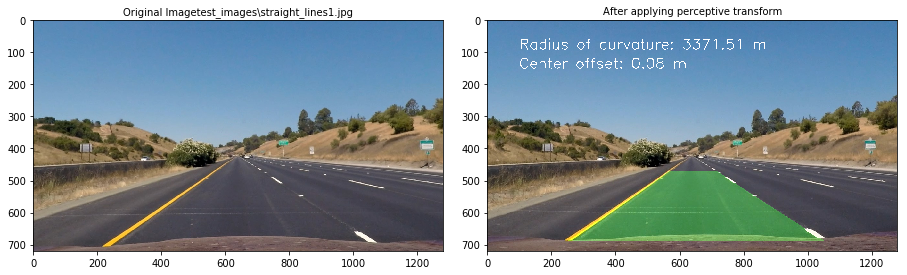

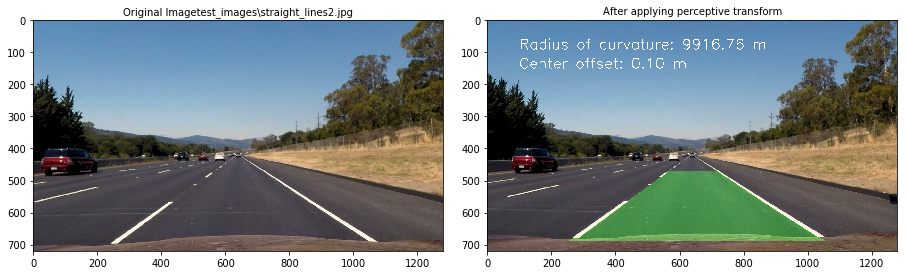

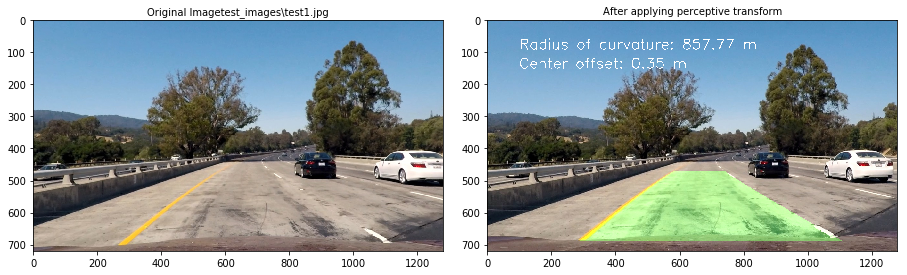

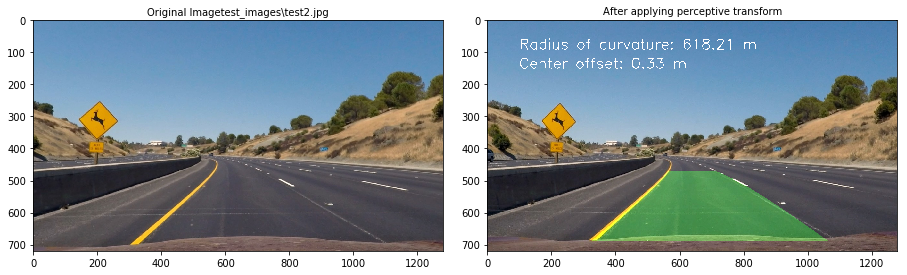

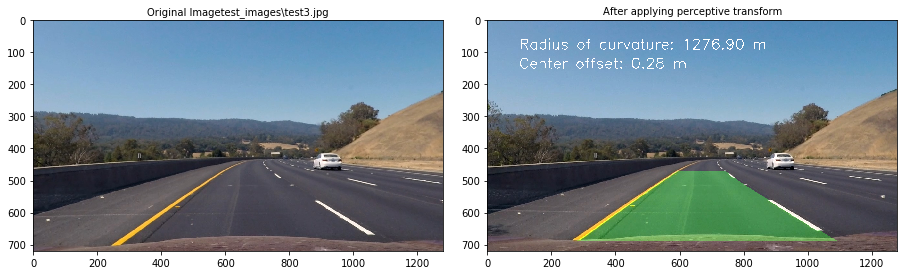

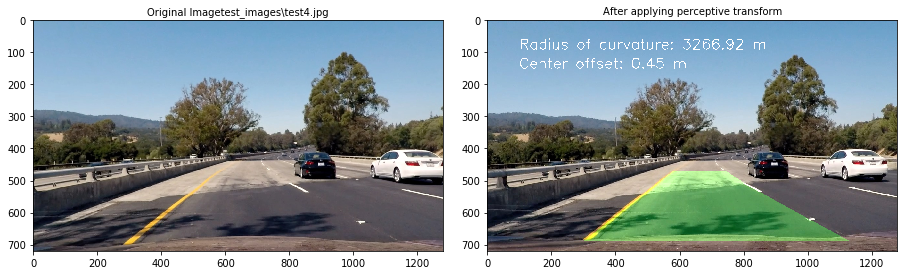

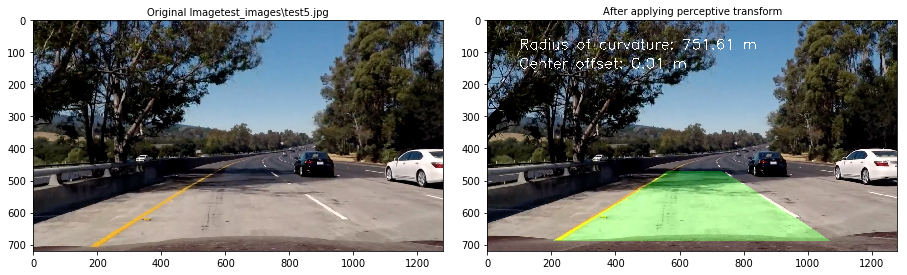

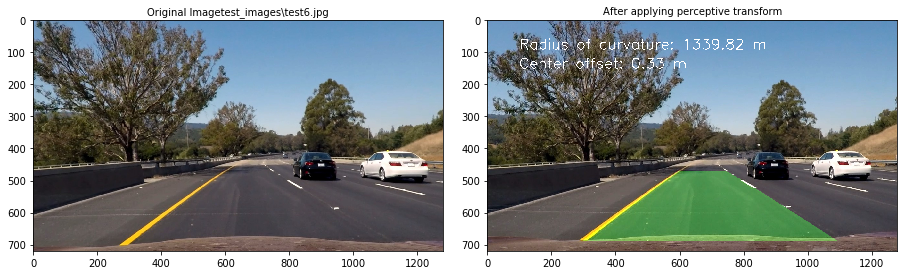

In [37]:
def final_test_store_output():
    #Store the camera transformation matrix "mtx" and distortion coefficients "dist"
    # This is one time step and therefore do outside the pipeline
    mtx,dist = calibrate_camera()

    images = glob.glob('test_images/*.jpg')
    for image_path in images:
        #Make sure this is reset for testing images
        global sane_left
        global sane_right
        sane_left = []
        sane_right = []
        # Read in an image
        image = mpimg.imread(image_path)
        undistorted_image  =  image_undist(image,mtx,dist)
        binary_warped, Minv = image_process_pipeline(image,mtx,dist)
        leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
        left_fitx ,right_fitx,out_img,left_radius,right_radius,center_offset = fit_polynomial(binary_warped)

        final_image = wrap_image_project(image,binary_warped,Minv,left_radius,right_radius,center_offset,left_fitx ,right_fitx)
        name = 'output_images/'+image_path.split('\\')[-1]
        plt.imsave(name,final_image)
        # Plot the result
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
        f.tight_layout()
        ax1.imshow(undistorted_image)
        ax1.set_title('Original Image'+image_path, fontsize=10)
        ax2.imshow(final_image)
        ax2.set_title('After applying perceptive transform', fontsize=10)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#Run the 
final_test_store_output()

### Function to handle video data frame by frame

In [33]:
def video_image_process(image):
    '''
    Function takes images of video and returns the frame with lane overlapped on it.
    Input: Video Frame image
    Output: Image with indentified lane overlapped
    '''
    #Undistort the image
    undistorted_image  =  image_undist(image,mtx,dist)
    #Process the image to get final binary image
    binary_warped, Minv = image_process_pipeline(image,mtx,dist)
    #Find the pixals along the lanes
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    # Fit the polinomial to identify the lanes
    left_fitx ,right_fitx,out_img,left_radius,right_radius,center_offset = fit_polynomial(binary_warped)
    #Project the identified lane onto the original image
    final_image = wrap_image_project(image,binary_warped,Minv,left_radius,right_radius,center_offset,left_fitx ,right_fitx)
    
    return final_image

### Process the video data and save it

In [34]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

global sane_left
global sane_right
sane_left = []
sane_right = []

output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(video_image_process) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████████████████████████████████▉| 1260/1261 [11:58<00:00,  1.91it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 12min


### Pipeline (video)

#### 1. Provide a link to your final video output.  Your pipeline should perform reasonably well on the entire project video (wobbly lines are ok but no catastrophic failures that would cause the car to drive off the road!).

In [43]:
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("project_video_output.mp4"))

### Discussion

#### 1. Briefly discuss any problems / issues you faced in your implementation of this project.  Where will your pipeline likely fail?  What could you do to make it more robust?

Wraping was a  big challenge as finding right parameters was very time consuming. After lot of trail and error was able to find the approriate parameters.

Sobel_y was not helping much, so didn't use it in the final image processing pipeline and also Sobel magnitude was omiited from the pipleine as it didn't add much value.

It took lot of time to comeup with a image processing pipeline as it involved lot of trails. Also used additional channels like R,G,L & B with thresholds.

The pipeline was not working great in dark areas and had to make use of B channel of Lab and L channel of LOV.This helped, but didn't got rid of the issue completely. So in complete dark area or area where lot of shadows present you might find some flickering.

One way of correcting this may be to store the recent successfull pixel/lane identification data or maitaining a moving avearge of recent data.

### Update
Based on the feedback received implemented the correction(Required Changes). In the first submit I was wrongly calculating the Center Offset and as suggested in review rectified it.

Also implemented a suggestion to include sane_lane() function, to handle scenarios where difference between 2 subsequent lanes is too high.



### Pipeline (single images)

#### 1. Provide an example of a distortion-corrected image.

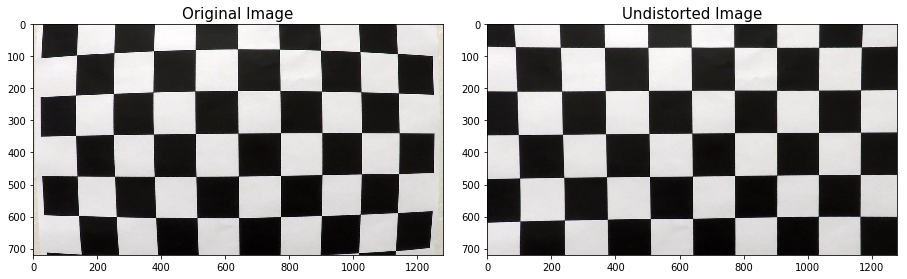

In [38]:

def test_calibration_undistort():
    #Store the camera transformation matrix "mtx" and distortion coefficients "dist"
    mtx,dist = calibrate_camera()

    # Load any chessboard image
    img = mpimg.imread('camera_cal/calibration1.jpg')

    #Get the undistorted image
    undistorted_image = image_undist(img,mtx,dist)

    #Display the images
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=15)
    ax2.imshow(undistorted_image)
    ax2.set_title('Undistorted Image', fontsize=15)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#Run the test
test_calibration_undistort()

#### 2. Describe how (and identify where in your code) you used color transforms, gradients or other methods to create a thresholded binary image.  Provide an example of a binary image result.

The image processing pipeline is implemented in the image_process_pipeline() function implemented above.

The following steps were done to come up with the image processing pipeline.

***Stage1:***

1. The distorted image was corrected using the coefficient got from the camera calibration function
2. Sobel gradients were calculated in both x & y direction and threshold was applied
3. Magnitude of the sobel_x & sobel_y were calculated and applied thresholds
4. Direction of the gradient was calculated and threshold applied.
5. Now using the above calculation a binary image was created.
Note: Sobel_y didn't add much value and even magnitude of the sobel gradients. So both of these were not used in the pipeline.

***Stage2:***
1. Image was converted to HLS image format and S Channel was separted out and threshold was applied
2. The binary image created in Stage1 and S_Channel binary image were combined to form another binary image
3. Combine the binary from above image with R,G & L Channel thresholds to get a intermediate binary image

***Stage3***
1. To improve the performance of pipeline in dark areas made used of L Channel of LUV image space and B Channel of Lab image space and thresholds were applied

2.The binary image resulting from the above step was combined with the binary image from Stage2 to get final binary image



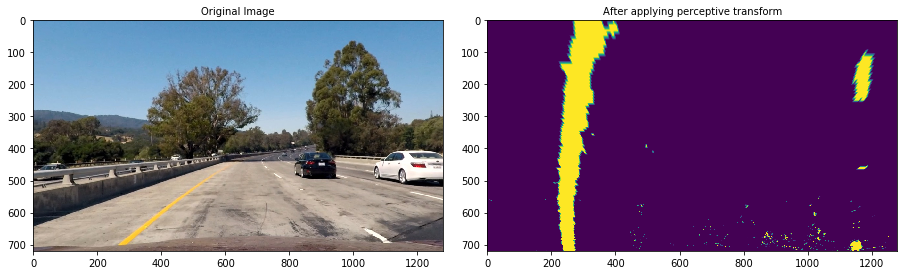

In [39]:
def test_image_process_pipeline():
    #Store the camera transformation matrix "mtx" and distortion coefficients "dist"
    # This is one time step and therefore do outside the pipeline
    mtx,dist = calibrate_camera()
    # Read in an image
    image = mpimg.imread('./test_images/test1.jpg')
    #print(image)
    undistorted_image  =  image_undist(image,mtx,dist)
    wraped_image, Minv = image_process_pipeline(image,mtx,dist)

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    f.tight_layout()
    ax1.imshow(undistorted_image)
    ax1.set_title('Original Image', fontsize=10)
    ax2.imshow(wraped_image)
    ax2.set_title('After applying perceptive transform', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#Run the test
test_image_process_pipeline()

#### 3. Describe how (and identify where in your code) you performed a perspective transform and provide an example of a transformed image.

Two functions get_perceptive_transform_params() & wrap_image() were  implemented to do the perspective transformation.

The function get_perceptive_transform_params() implemented above, takes an image as input and returns perceptive transformation matrices.
This is basically done by identifying 4 source points and corresponding destination points and then making use of getPerspectiveTransform() function of cv2 we get the transformation matrix.

Then another function wrap_image() makes use of the transformation matrices from above and then does perceptive transformation of the image using warpPerspective() function of cv2.

wrap_image_project() is another function written to project the identified lanes on to the original image by using inverse transformation matrix

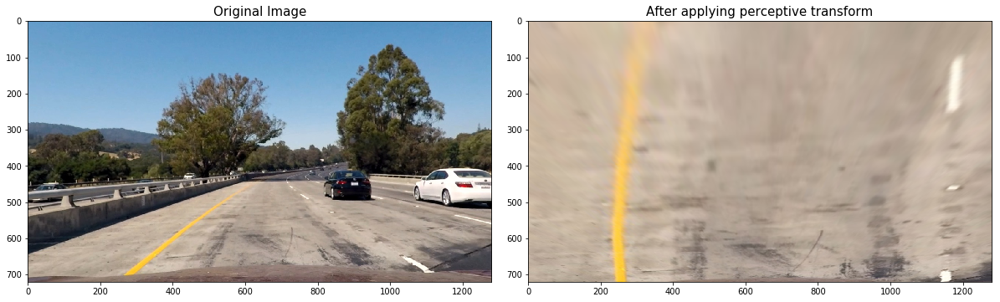

In [40]:
def test_preceptive_transform():
    # Test the hls_select function
    # Read in an image
    image = mpimg.imread('./test_images/test1.jpg')
    undistorted_image  =  image_undist(image,mtx,dist)

    #Apply the functions
    M,Minv = get_perceptive_transform_params(image)
    wraped_image = wrap_image(undistorted_image,M)

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    f.tight_layout()
    ax1.imshow(undistorted_image)
    ax1.set_title('Original Image', fontsize=15)
    ax2.imshow(wraped_image)
    ax2.set_title('After applying perceptive transform', fontsize=15)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#Test the function
test_preceptive_transform()

#### 4. Describe how (and identify where in your code) you identified lane-line pixels and fit their positions with a polynomial?


This is implemented in above code using functions find_lane_pixels() and fit_polynomial().
First we identify the starting points by summing across image pixels vertically and finding the maximum values. Then we take a sliding window approach to identify the subsequent windows. Once we identify the pixels along the left and right lanes we try to fit a polynomials for these 2 lanes using the pixels identified.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


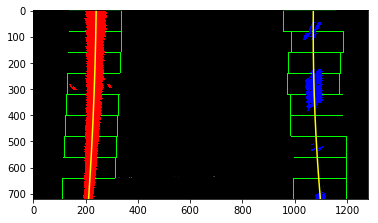

In [41]:
global sane_left
global sane_right
sane_left = []
sane_right = []
def test_2():
    #Store the camera transformation matrix "mtx" and distortion coefficients "dist"
    # This is one time step and therefore do outside the pipeline
    mtx,dist = calibrate_camera()

    # Read in an image
    image = mpimg.imread('./test_images/straight_lines1.jpg')
    undistorted_image  =  image_undist(image,mtx,dist)
    binary_warped, Minv = image_process_pipeline(image,mtx,dist)

    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    left_fitx ,right_fitx,out_img,left_radius,right_radius,center_offset = fit_polynomial(binary_warped,display=True)
    plt.imshow(out_img)

#Run the test
test_2()

#### 5. Describe how (and identify where in your code) you calculated the radius of curvature of the lane and the position of the vehicle with respect to center.

The measurement of curavature radius and center offset is implemented in measure_curvature_real() function above.

Using the already identified left lane pixels and right lane pixels , a polynomial is fit.Then using the coffecients calcualted the left and right curvature radius is calculated using the following formulae:

    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    

Similary lane center is calculated and then the distance of this lane center from image center is identified.

Above values are got in pixels and this is converted to meters using the following conversion ratios:

    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

#### Update.
As per feedback in the previous submit rectified the way Center Offset was calculated.

#### 6. Provide an example image of your result plotted back down onto the road such that the lane area is identified clearly.

wrap_image_project() written above implments this logic. It takes the lane identified in the wraped binary image and projects it back on to the original image.
It uses the inverse transformation matrix calculated in one of the previous steps to do this.
Also the curvature radius and lane center offset from image center also is wrriten on the original image.


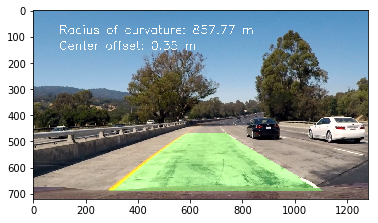

In [42]:
global sane_left
global sane_right
sane_left = []
sane_right = []
def test_4():
    #Store the camera transformation matrix "mtx" and distortion coefficients "dist"
    # This is one time step and therefore do outside the pipeline
    mtx,dist = calibrate_camera()

    # Read in an image
    image = mpimg.imread('./test_images/test1.jpg')
    undistorted_image  =  image_undist(image,mtx,dist)
    binary_warped, Minv = image_process_pipeline(image,mtx,dist)

    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    left_fitx ,right_fitx,out_img,left_radius,right_radius,center_offset = fit_polynomial(binary_warped)

    final_image = wrap_image_project(image,binary_warped,Minv,left_radius,right_radius,center_offset,left_fitx ,right_fitx)
    plt.imshow(final_image)

test_4()
